# Определение жанра по изображению обложки музыкального диска

<div style="border:solid Chocolate 2px; padding: 40px">

## Описание проекта

    
Pet-проект, чтобы потренировать навыки, приобрести новые и нескучно провести время.
Очевидно, что оформление музыкального альбома как-то связано с его содержанием. Но насколько связано? Как подтвердить это, опираясь на данные? И чем это может быть полезно?
Основная задача
Необходимо разработать модель, которая определит жанр музыкального альбома по изображению его обложки.


<b>Описание данны</b>

Изображения в формате PNG, упакованные в zip-архивы. Имя архива соответствует музыкальному жанру. Каждый zip-архив содержит папку с изображениями музыкальных обложек соответствующего жанра.



In [ ]:
# !pip install umap-learn
# pip install umap-learn[plot]
# ! pip install fastai

In [3]:
import pandas as pd
import numpy as np
import time
import statistics as stat
import os
import faiss

import umap 
import umap.plot  
from umap import UMAP

import joblib
import random

RANDOM_STATE = 12345

from tqdm import tqdm
from tqdm import notebook

import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import transforms

from fastai.vision.all import *


import warnings
warnings.filterwarnings("ignore")

from PIL import Image

import sklearn
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.metrics import f1_score, precision_score, recall_score, roc_curve, roc_auc_score, \
                            make_scorer, classification_report, accuracy_score, \
                            confusion_matrix, ConfusionMatrixDisplay, \
                            silhouette_samples, silhouette_score
from sklearn.compose import make_column_transformer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn import preprocessing

import matplotlib.pyplot as plt
import matplotlib.cm as cm

import plotly.express as px

import mpl_toolkits.mplot3d

C:\Users\Katya\AppData\Roaming\Python\Python311\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
C:\ProgramData\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,
C:\ProgramData\anaconda3\Lib\site-packages\umap\plot.py:203: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit(nopython=False)
C:\ProgramData\anaconda3\Lib\site-packages\transformers\utils\generic.py:441: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Plea

## Загрузка данных

Импортируем данные и напишем функцию для просмотра информации о датафреймах.

In [4]:
# Напишем функцию для создания датафрейма с данными
# Для удобства доступа пропишем в качестве названия изображения его полный путь
def create_data_frame(path):
    name_list = []
    genre_list = []
    for address, dirs, files in os.walk(path):
        for name in files:
            name_list.append(os.path.join(address, name))
            genre_list.append(''.join(address.split('/')[-1:]))
    data = pd.DataFrame([name_list, genre_list]).transpose()
    data.columns=['image', 'genre']
    return data

In [5]:
path = "./dataset/"
data = create_data_frame(path)

In [6]:
print(data.shape)
data.head()

(7800, 2)


,image,genre
0,./dataset/anime\00095702-6b86-4bb1-880e-1e09e759a013.png,anime
1,./dataset/anime\0091bee3-a67a-457e-8c5f-b4a1055b1211.png,anime
2,./dataset/anime\00a9d688-337f-4807-83cd-596540f1683b.png,anime
3,./dataset/anime\00ddb3de-75db-4e27-ad3d-441a5dc95636.png,anime
4,./dataset/anime\00ec64ef-c6ab-4a63-91df-59ce8db4ea25.png,anime


genre
country        0.190513
anime          0.152436
classical      0.122436
jazz           0.105256
pop            0.102949
edm            0.092179
reggae         0.074487
disco          0.060000
black metal    0.057692
rap            0.042051
Name: proportion, dtype: float64

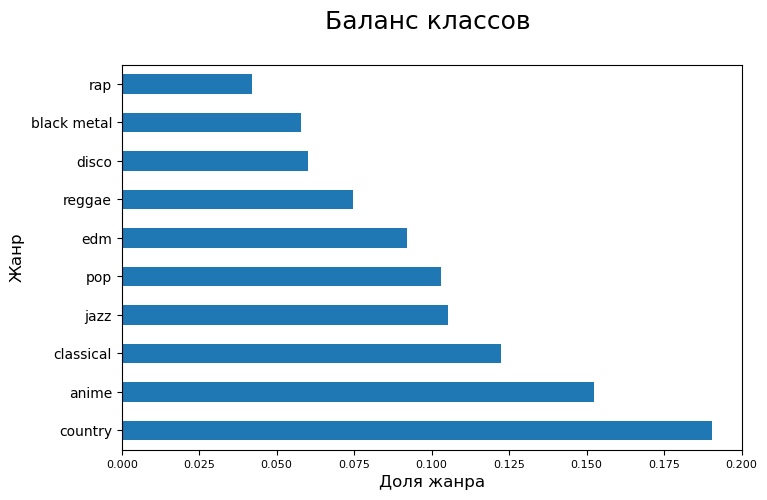

In [7]:
# Проверим баланс классов
display(data['genre'].value_counts(normalize=True))

plt.figure(figsize=(8,5))
data['genre'].value_counts(normalize=True).plot(kind='barh')
plt.xlabel("Доля жанра", fontsize=12)
plt.ylabel("Жанр", fontsize=12)
plt.xticks(fontsize=8)
plt.yticks(fontsize=10)
plt.title("Баланс классов \n", fontsize=18)
plt.show();

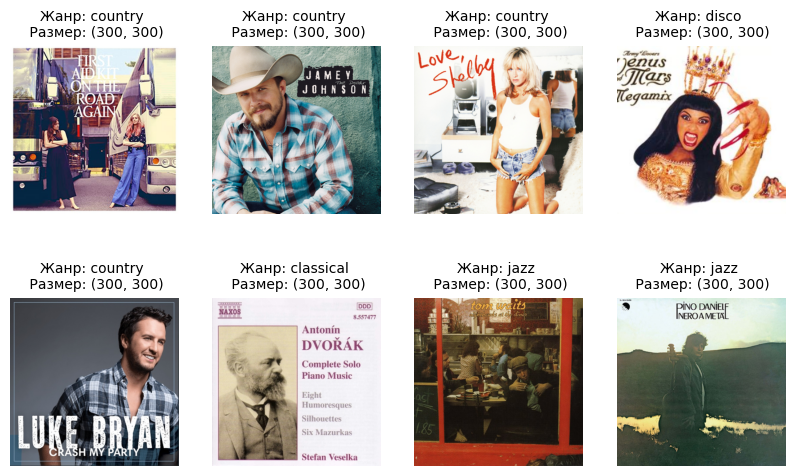

In [8]:
# Выведем несолько изображений
pic_num = 8
col_num = 4
row_num = math.ceil(pic_num/col_num)

fig = plt.figure(figsize=(10, 6)) 
j=1
for i in [random.randint(0, data.shape[0]-1) for i in range(pic_num)]:
    image_name = data.iloc[i]['image']
    img_genre = data.iloc[i]['genre']
    img = Image.open(image_name).convert('RGB')  
    
    fig.add_subplot(row_num, col_num, j) 
    plt.imshow(img) 
    plt.axis('off') 
    plt.title(f'Жанр: {img_genre} \n Размер: {img.size}', fontsize=10)
    j+=1

**Вывод**

Данные содержат 7800 изображений - обложек альбомов в 10 разных жанрах. Размер изображений 300x300 dpi. Хорошо виден дисбаланс классов. Больше всего изображений в стиле "country", меньше всего в стиле "rap". Однако это пока не значит, что малочисленные жанры будут определяться хуже. Всё зависит от того насколько хорошо разграничены вектора изображений. Вернёмся к этому анализу после получения эмбедингов изображений.

## 3. Векторизация изображений



Для векторизации изображений используем предобученную модель resnet50. Уберем последний слой, чтобы получить на выходе вектор. На примере одного из изображений посмотрим, какой вектор получается.

In [15]:
resnet = models.resnet50( weights="IMAGENET1K_V2")

for param in resnet.parameters():
    ### замораживаем веса
    param.requires_grad_(False)
    
### берём все слои кроме последнего
modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules)
resnet.eval();

### модель resnet50 обучалась на изображениях размером 224*224
### переводим изображение в нужный формат: меняем размер картинки  и нормализуем
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                            std=[0.229, 0.224, 0.225]
                            )
preprocess = transforms.Compose([transforms.Resize(224),
                                 transforms.ToTensor(),
                                 norm])

Жанр: anime
(300, 300)


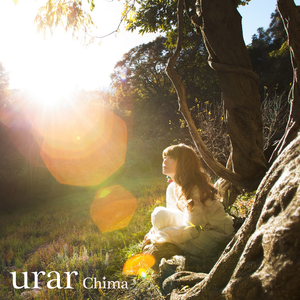

torch.Size([2048])

In [16]:
# Для проверки работы применим векторизацию к одному изображению
row = data.sample(1)

row = data.sample(1)
image_name = row.iloc[0]['image']
img_genre = row.iloc[0]['genre']
# img = Image.open(path + img_genre + '/' + img_genre + '/' + image_name).convert('RGB')
img = Image.open(image_name).convert('RGB')

print(f'Жанр: {img_genre}')
print(img.size)
display(img)

image_tensor = preprocess(img)
output_tensor = resnet(image_tensor.unsqueeze(0)).flatten()
output_tensor.size()

In [17]:
### Напишем функцию для векторизации всех изображений
def vectorize_img(data, path):
    image_vec = []
    img_names = pd.DataFrame(data.image, columns=['image'])
    for image, genre in tqdm(zip(data['image'], data['genre'])):
#         img = Image.open(path + genre + '/' + genre + '/' + image).convert('RGB')
        img = Image.open(image).convert('RGB')
        image_tensor = preprocess(img)
        output_tensor = resnet(image_tensor.unsqueeze(0)).flatten().numpy()
        image_vec.append(output_tensor)
    print(f'Размер вектора изображений: {np.array(image_vec).shape}')

    df_img = pd.concat([img_names, pd.DataFrame(image_vec)], axis= 1)
#     df_img.columns = ['img_' + str(column) if isinstance(column, int) 
#                              else str(column) for column in df_img.columns]    
    return df_img

In [18]:
%%time
df_img = vectorize_img(data, path)

7800it [06:54, 18.80it/s]


Размер вектора изображений: (7800, 2048)
CPU times: total: 55min 20s
Wall time: 6min 57s


Поличили вектор размерностью 2048. Выделим целевой признак и выберем названия изображений в качестве индекса.

In [19]:
### Выделим целевой признак
df_img['target'] = data['genre']

In [20]:
###  выберем названия изображений в качестве индекса
df_img.set_index('image', inplace=True)

In [21]:
df_img.head()

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,target
image,,,,,,,,,,,,,,,,,,,,,
./dataset/anime\00095702-6b86-4bb1-880e-1e09e759a013.png,0.000000,0.000000,0.035179,0.027881,0.149840,0.010321,0.001407,0.197334,0.000000,0.000000,...,0.000000,0.000000,0.127244,0.259436,0.000000,0.000000,0.034095,0.0,0.000000,anime
./dataset/anime\0091bee3-a67a-457e-8c5f-b4a1055b1211.png,0.176853,0.000000,0.000000,0.000000,1.134798,0.000000,0.036892,1.620787,0.023502,0.138598,...,0.063368,0.121753,0.000000,0.000000,0.413217,0.021095,0.129068,0.0,0.025434,anime
./dataset/anime\00a9d688-337f-4807-83cd-596540f1683b.png,0.157099,0.000000,0.209392,0.076562,1.689459,0.026375,0.181093,0.877752,0.011194,0.000000,...,0.000000,0.000000,0.079667,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,anime
./dataset/anime\00ddb3de-75db-4e27-ad3d-441a5dc95636.png,0.059568,0.020817,0.001673,0.000000,0.514819,0.000000,0.094450,0.000000,0.148765,0.000000,...,0.038785,0.370961,0.000000,0.044091,0.082865,0.130516,0.000000,0.0,0.025184,anime
./dataset/anime\00ec64ef-c6ab-4a63-91df-59ce8db4ea25.png,0.312399,0.000000,0.048631,0.029105,0.372685,0.000000,0.245102,0.769446,0.905570,0.048723,...,1.766432,0.099262,0.000000,0.000000,0.050188,0.475912,0.000000,0.0,0.145091,anime


**Вывод**

Используя предобученную модель resnet50 мы получили вектора для каждого изображения из обучающего датасета. Теперь стоит проверить есть ли дубликаты в данных.

## Поиск и удаление дубликатов

In [22]:
df_img.duplicated().sum()

40

In [23]:
### Посмотрим эти строки
data_duplicated = df_img[df_img.duplicated(keep=False)==True].copy()

col_list = list(data_duplicated.columns)
data_duplicated.sort_values(by=col_list, inplace=True)

In [24]:
data_duplicated

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,target
image,,,,,,,,,,,,,,,,,,,,,
./dataset/jazz\3aaa9d21-4982-4c13-a1bb-caa57195fee6.png,0.000000,0.000000,0.000000,0.000000,0.498286,0.004985,0.000000,0.211169,0.000000,0.0000,...,0.000000,0.000000,0.000000,0.000000,0.011033,0.303819,0.004022,0.0000,0.000000,jazz
./dataset/jazz\5307d417-aacf-4608-b780-26c54a86911e.png,0.000000,0.000000,0.000000,0.000000,0.498286,0.004985,0.000000,0.211169,0.000000,0.0000,...,0.000000,0.000000,0.000000,0.000000,0.011033,0.303819,0.004022,0.0000,0.000000,jazz
./dataset/edm\382fecd7-680e-4bc2-91a3-7f250569e7e4.png,0.000000,0.000000,0.000000,0.115065,1.596007,0.000831,0.000000,0.118941,0.000000,0.0000,...,0.000000,0.000000,0.000000,0.000000,0.111059,0.877375,0.000000,0.0042,0.015096,edm
./dataset/edm\8a2ce4e7-efde-4922-a5b0-455a1c3bd4e6.png,0.000000,0.000000,0.000000,0.115065,1.596007,0.000831,0.000000,0.118941,0.000000,0.0000,...,0.000000,0.000000,0.000000,0.000000,0.111059,0.877375,0.000000,0.0042,0.015096,edm
./dataset/pop\1b4f8392-566f-48eb-9c79-da2d02e7d74a.png,0.000000,0.000000,0.004419,0.000000,1.315822,0.128497,0.148220,0.429256,0.118166,0.0000,...,0.000000,0.006098,0.000743,0.169338,0.000000,0.166471,0.000000,0.0000,0.026556,pop
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
./dataset/classical\ff0f6253-00db-4472-85a9-8870ba4014b7.png,0.343548,0.098294,0.920350,0.055942,0.000000,0.000000,0.139523,0.000000,0.006021,0.0000,...,0.001883,0.000534,0.255930,0.084127,0.013251,0.030111,0.028223,0.0000,0.019490,classical
./dataset/pop\695b4a0e-985d-49a8-a315-7c7831a60ff2.png,0.482753,0.000000,0.258827,0.311104,1.882453,0.016566,0.014772,2.560769,0.009868,0.0049,...,0.023474,0.000000,0.013277,0.000000,0.880541,0.055681,0.006045,0.0000,0.000000,pop
./dataset/pop\ed9baabb-11bb-487f-9bc4-2096e693fa3e.png,0.482753,0.000000,0.258827,0.311104,1.882453,0.016566,0.014772,2.560769,0.009868,0.0049,...,0.023474,0.000000,0.013277,0.000000,0.880541,0.055681,0.006045,0.0000,0.000000,pop


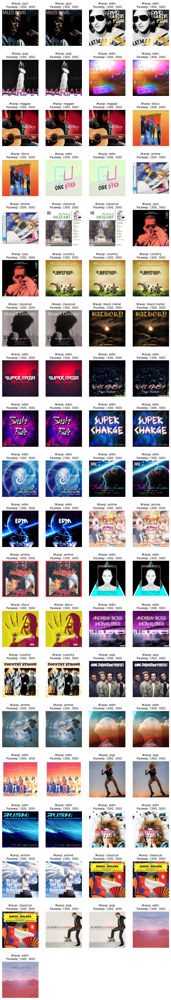

In [25]:
# Выведем несолько изображений
pic_num = data_duplicated[0].count()
col_num = 4
row_num = math.ceil(pic_num/col_num)

fig = plt.figure(figsize=(10, 60)) 
j=1
for i in range(0, data_duplicated.shape[0]):
    image_name = data_duplicated.iloc[[i]].index[0]
    img_genre = data_duplicated.iloc[i]['target']
    img = Image.open(image_name).convert('RGB')  
    
    fig.add_subplot(row_num, col_num, j) 
    plt.imshow(img) 
    plt.axis('off') 
    plt.title(f'Жанр: {img_genre} \n Размер: {img.size}', fontsize=10)
    j+=1

Получим список изображений дубликатов.

In [26]:
### Получим список изображений дубликатов, сможем использовать его при необходимости позже
dupl_list = df_img[df_img.duplicated(keep='first')].index.to_list()
dupl_list

['./dataset/anime\\054883a9-b2e2-4e52-ad52-c980ea768cf0.png',
 './dataset/anime\\16072b25-550c-43b3-9cd3-6f575ec0a0ee.png',
 './dataset/anime\\680519a3-9a87-428b-8d3b-c7ef4b005de6.png',
 './dataset/anime\\bf9fe9d3-9393-4d02-9e21-db866297241b.png',
 './dataset/anime\\e0f6f77d-b589-4370-aa16-975fa91f481e.png',
 './dataset/black metal\\151a2a52-ffe7-35e1-9fa2-b03d1cd86fb7.png',
 './dataset/classical\\59e085a2-1b7f-4629-bbf5-d02244e05983.png',
 './dataset/classical\\8e012a89-4adf-4ac1-8837-a740d7da7d0f.png',
 './dataset/classical\\ce7a56b3-f52a-4ad0-81f1-7a5a041bcc34.png',
 './dataset/classical\\ff0f6253-00db-4472-85a9-8870ba4014b7.png',
 './dataset/country\\62b6ad6f-919d-487e-8a93-2360ad45cb52.png',
 './dataset/country\\c9e52ce6-963f-4891-94aa-8c3e19224d4e.png',
 './dataset/country\\d727b7de-bc03-41a3-82eb-0ec306238543.png',
 './dataset/disco\\bd1392ee-f988-461a-8b35-2da8c856ce67.png',
 './dataset/disco\\cd93fa72-8f5a-4471-ae9a-8921987e1d1f.png',
 './dataset/edm\\18613466-5471-4b8e-8a46-3

In [27]:
print('Размер датафрема до удаления:', df_img.shape)

Размер датафрема до удаления: (7800, 2049)


In [28]:
### Удалим дублирующиеся строки
df_img.drop_duplicates(keep='first', inplace=True)

In [29]:
print('Размер датафрема до удаления:', df_img.shape)

Размер датафрема до удаления: (7760, 2049)


## Сохранение векторов

In [26]:
### Сохраним подготовленные и очищенные от дубликатов вектора
df_img.to_csv(path + r'my_data_RESNET50.csv')

In [210]:
## Загрузка датафрейма с векторами
df_img = pd.read_csv(path + r'my_data_RESNET50.csv', index_col='image')

df_img.head()

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,target
image,,,,,,,,,,,,,,,,,,,,,
./anime/anime/00095702-6b86-4bb1-880e-1e09e759a013.png,0.000000,0.000000,0.035179,0.027881,0.149840,0.010321,0.001407,0.197334,0.000000,0.000000,...,0.000000,0.000000,0.127244,0.259436,0.000000,0.000000,0.034095,0.0,0.000000,anime
./anime/anime/0091bee3-a67a-457e-8c5f-b4a1055b1211.png,0.176853,0.000000,0.000000,0.000000,1.134798,0.000000,0.036892,1.620787,0.023502,0.138598,...,0.063368,0.121753,0.000000,0.000000,0.413217,0.021095,0.129068,0.0,0.025434,anime
./anime/anime/00a9d688-337f-4807-83cd-596540f1683b.png,0.157099,0.000000,0.209392,0.076562,1.689459,0.026375,0.181093,0.877752,0.011194,0.000000,...,0.000000,0.000000,0.079667,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,anime
./anime/anime/00ddb3de-75db-4e27-ad3d-441a5dc95636.png,0.059568,0.020817,0.001673,0.000000,0.514819,0.000000,0.094450,0.000000,0.148765,0.000000,...,0.038785,0.370961,0.000000,0.044091,0.082865,0.130516,0.000000,0.0,0.025184,anime
./anime/anime/00ec64ef-c6ab-4a63-91df-59ce8db4ea25.png,0.312399,0.000000,0.048631,0.029105,0.372685,0.000000,0.245102,0.769446,0.905570,0.048723,...,1.766432,0.099262,0.000000,0.000000,0.050188,0.475912,0.000000,0.0,0.145091,anime


In [14]:
df_img['target'].unique()

array(['anime', 'black metal', 'classical', 'country', 'disco', 'edm',
       'jazz', 'pop', 'rap', 'reggae'], dtype=object)

## 1. Исследовательский анализ данных (UMAP)

Посмотрим насколько разделены классы

### umap plot

In [15]:
X = df_img[df_img.columns.drop('target')].values

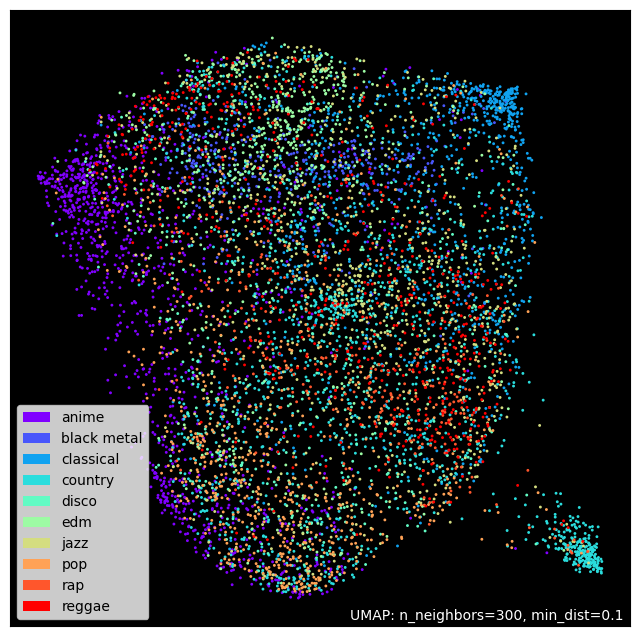

In [214]:
manifold = umap.UMAP(n_components=2, n_neighbors=300, min_dist = 0.1).fit(X)
umap.plot.points(manifold, labels=df_img['target'].to_numpy(), theme="fire")
plt.savefig('resnet50_vec.png')

### umap plotly.express

In [17]:
X = df_img.drop('target', axis=1).values
y = df_img['target'].values


umap_2d = UMAP(n_components=2, init='random', random_state=RANDOM_STATE)
umap_3d = UMAP(n_components=3, init='random', random_state=RANDOM_STATE)

proj_2d = umap_2d.fit_transform(X)
proj_3d = umap_3d.fit_transform(X)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=y, 
    opacity = 0.6,
    labels={'color': 'genres'}
)
fig_2d.update_traces(marker=dict(size=5))

fig_3d = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=y, 
    opacity = 0.6,
    labels={'color': 'genres'}
)
fig_3d.update_traces(marker_size=5)

fig_2d.show()
fig_3d.show()

### umap matplotlib

In [18]:
enc = OrdinalEncoder()
target_enc = enc.fit_transform(df_img['target'].to_frame())
X = df_img[df_img.columns.drop('target')].values
y = target_enc.flatten()


umap_2d = UMAP(n_components=2, init='random', random_state=RANDOM_STATE)
umap_3d = UMAP(n_components=3, init='random', random_state=RANDOM_STATE)

proj_2d = umap_2d.fit_transform(X)
proj_3d = umap_3d.fit_transform(X)

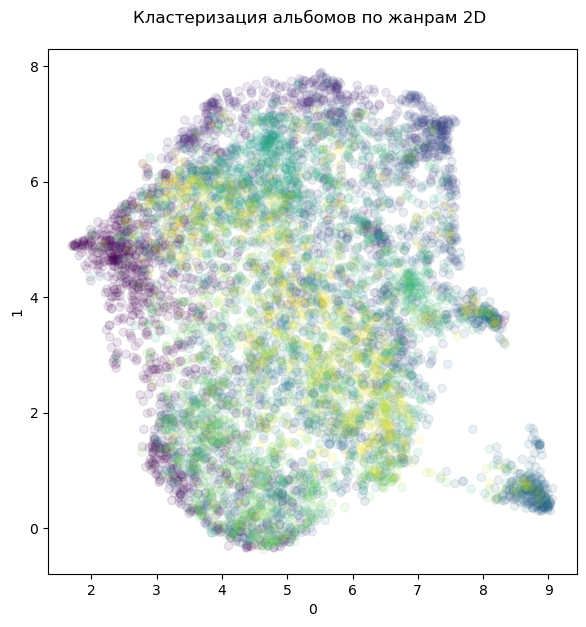

In [19]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(2, 2, 1)

ax.scatter(proj_2d[:, 0], proj_2d[:, 1], c=y, alpha=0.1)
ax.set_xlabel("0")
ax.set_ylabel("1")
ax.set_title('Кластеризация альбомов по жанрам 2D \n')
plt.show()

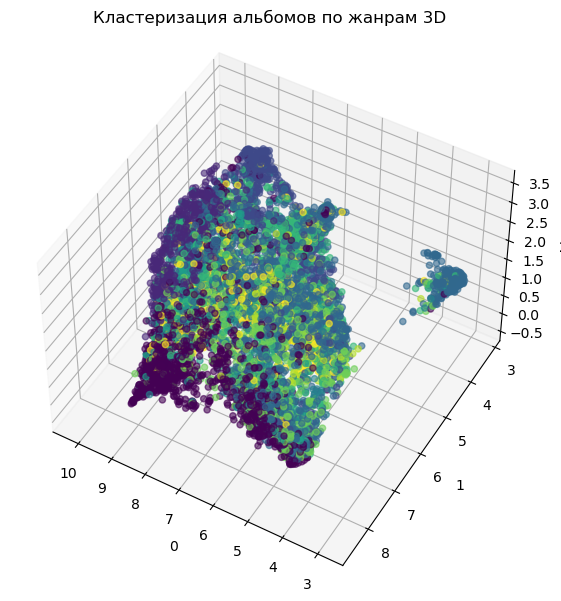

In [20]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(2, 2, 1, projection="3d", elev=48, azim=120)

ax.scatter(proj_3d[:, 0], proj_3d[:, 1], proj_3d[:, 2], c=y, alpha=0.6)#, edgecolor="r"
ax.set_xlabel("0")
ax.set_ylabel("1")
ax.set_zlabel("2")
ax.set_title('Кластеризация альбомов по жанрам 3D \n')
plt.show()

## Разделим данные на обучающие и тестовые

In [23]:
def split(df, test_size=0.25):

    target = df['target']
    features = df.drop(['target'], axis=1)
    
    features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=test_size, 
                                                                                random_state=RANDOM_STATE, 
                                                                                stratify=target,
                                                                                shuffle = True)
    print('Размер обучающей выборки:', features_train.shape[0], 'строк - ', round(features_train.shape[0]/df.shape[0] * 100), "%")
    print('Размер тестовой выборки:', features_test.shape[0], 'строк - ', round(features_test.shape[0]/df.shape[0] * 100), "%")
    return features_train, target_train, features_test, target_test

In [26]:
features_train, target_train, features_test, target_test = split(df_img)

Размер обучающей выборки: 5820 строк -  75 %
Размер тестовой выборки: 1940 строк -  25 %


In [39]:
features_train.head()

,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
image,,,,,,,,,,,,,,,,,,,,,
./dataset/pop\bb3dcf8e-7ecf-4e16-af2f-9f596d026b70.png,0.000000,0.010622,0.000000,0.000000,0.467218,0.000000,0.000000,0.094044,0.000000,0.000000,...,0.351550,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000
./dataset/anime\676530b2-bce3-4c31-9ca7-7cc5688b3c36.png,0.187347,0.009245,2.030680,0.000000,2.610457,0.000000,0.001612,1.689564,0.433728,0.000000,...,0.065502,0.198512,0.000000,0.053255,0.0,0.058388,0.0,0.099783,0.000000,0.000000
./dataset/black metal\b424cc84-2d72-48ef-8f46-c469871ee818.png,0.000000,0.000000,0.000000,0.000000,2.560780,0.000000,0.025607,0.000000,0.543572,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.043195,0.0,0.000000,0.000000,0.002809
./dataset/jazz\9d07bc84-cc06-4314-9cf5-94566a749ad3.png,0.000000,0.114778,2.581224,0.217277,0.058374,0.019656,0.109925,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.062179,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000
./dataset/edm\8fef5a4d-bc90-4578-99b8-e7a1b0b0f26a.png,0.616164,0.046137,0.000000,0.000000,1.928123,0.000000,0.002044,0.000000,0.045782,0.003961,...,0.000000,0.935417,0.000000,0.000000,0.0,0.900938,0.0,0.015431,0.015459,0.120850


In [90]:
target_train.value_counts(normalize=True)

target
country        0.191065
anime          0.152577
classical      0.122509
jazz           0.105498
pop            0.102921
edm            0.090550
reggae         0.074570
disco          0.060137
black metal    0.057904
rap            0.042268
Name: proportion, dtype: float64

In [91]:
target_test.value_counts(normalize=True)

target
country        0.191237
anime          0.152577
classical      0.122680
jazz           0.105670
pop            0.103093
edm            0.090206
reggae         0.074742
disco          0.059794
black metal    0.057732
rap            0.042268
Name: proportion, dtype: float64

## Построение baseline

### KNN

In [148]:
### Построим простую модель классификации на базе KNeighborsClassifier (K ближайших соседей)
neigh_base = KNeighborsClassifier(n_neighbors=3)#, weights='distance')#'distance'

neigh_base.fit(features_train, target_train)
preds = neigh_base.predict(features_test)
neigh_base.classes_

array(['anime', 'black metal', 'classical', 'country', 'disco', 'edm',
       'jazz', 'pop', 'rap', 'reggae'], dtype=object)

In [149]:
target_names = list(target_train.unique())
print(classification_report(target_test, preds, target_names=target_names))

              precision    recall  f1-score   support

         pop       0.50      0.77      0.61       296
       anime       0.60      0.67      0.64       112
 black metal       0.46      0.79      0.58       238
        jazz       0.48      0.55      0.51       371
         edm       0.21      0.13      0.16       116
   classical       0.53      0.23      0.32       175
     country       0.37      0.29      0.33       205
      reggae       0.42      0.23      0.30       200
       disco       0.64      0.17      0.27        82
         rap       0.36      0.23      0.28       145

    accuracy                           0.47      1940
   macro avg       0.46      0.41      0.40      1940
weighted avg       0.46      0.47      0.44      1940



Попробуем усовершенствовать модель.

In [29]:
k_range = list(range(1, 31))
weight_options = ['uniform', 'distance']
param_grid = dict(n_neighbors=k_range, weights=weight_options)
print(param_grid)

{'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30], 'weights': ['uniform', 'distance']}


In [30]:
knn = KNeighborsClassifier(n_jobs=-1)
grid = GridSearchCV(knn, param_grid, cv=10, scoring='accuracy', return_train_score=False, verbose=False)
grid.fit(features_train, target_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(n_jobs=-1),
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy', verbose=False)

In [31]:
grid.best_params_

{'n_neighbors': 22, 'weights': 'distance'}

In [183]:
preds = grid.predict(features_test)

In [185]:
target_names = list(target_train.unique())
print(classification_report(target_test, preds, target_names=target_names))

              precision    recall  f1-score   support

         pop       0.63      0.78      0.70       296
       anime       0.84      0.65      0.73       112
 black metal       0.54      0.79      0.64       238
        jazz       0.57      0.62      0.60       371
         edm       0.39      0.10      0.16       116
   classical       0.72      0.32      0.44       175
     country       0.36      0.39      0.37       205
      reggae       0.43      0.46      0.44       200
       disco       0.81      0.27      0.40        82
         rap       0.35      0.40      0.37       145

    accuracy                           0.54      1940
   macro avg       0.56      0.48      0.49      1940
weighted avg       0.55      0.54      0.52      1940



Посмотрим график зависимости метрики от количества соседей и метода.

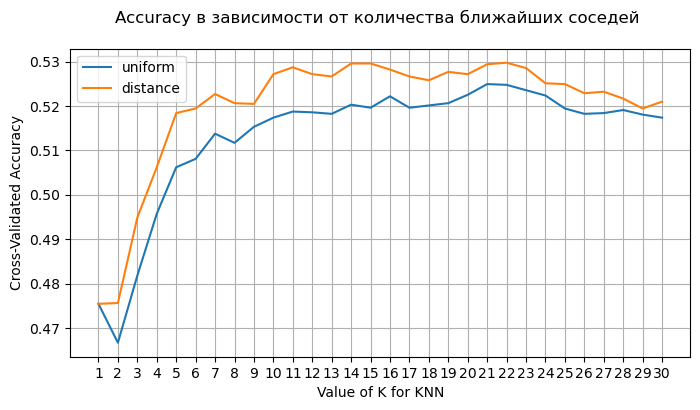

In [135]:
df_res = pd.DataFrame(grid.cv_results_['params'])
df_res['mean_test_score'] = grid.cv_results_['mean_test_score']
weights_list = df_res['weights'].unique()

plt.figure(figsize=(8,4))
plt.plot(k_range, df_res[df_res['weights']==weights_list[0]]['mean_test_score'])
plt.plot(k_range, df_res[df_res['weights']==weights_list[1]]['mean_test_score'])
plt.title('Accuracy в зависимости от количества ближайших соседей \n', fontsize=12)
plt.xlabel('Value of K for KNN', fontsize=10)
plt.xticks(list(range(1, 31)))
plt.ylabel('Cross-Validated Accuracy', fontsize=10)
plt.legend(weights_list)
plt.grid()
plt.show()

Можно заметить, что наилучшее значение метрики мы получаем при n_neighbors=16 ближайших соседей. Потом метрика плавно снижается.

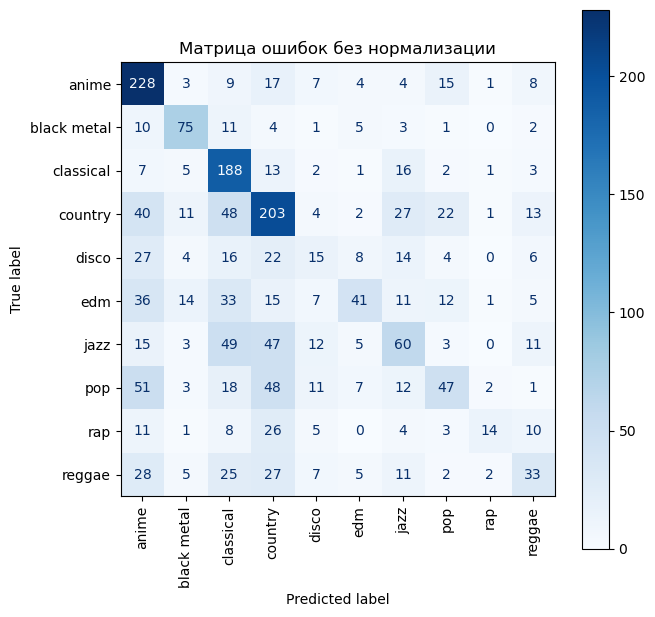

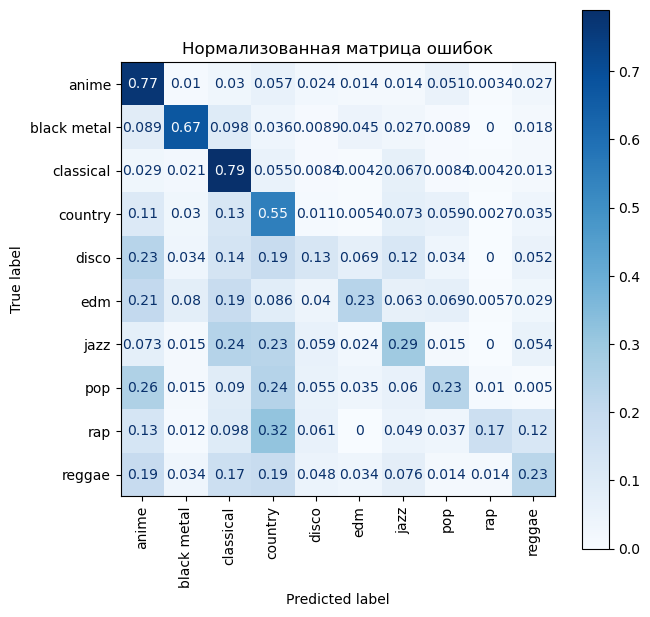

In [142]:
# Plot non-normalized confusion matrix
titles_options = [
    ("Матрица ошибок без нормализации", None),
    ("Нормализованная матрица ошибок", "true"),
]
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(7,7))
    cmp = ConfusionMatrixDisplay.from_estimator(
        neigh_base,
        features_test,
        target_test,
        display_labels=neigh_base.classes_,
        cmap=plt.cm.Blues,
        normalize=normalize,
        xticks_rotation="vertical",
        ax=ax)
    
    cmp.ax_.set_title(title)
    

plt.show()


In [187]:
### Сохраним модель
joblib.dump(neigh, "model.pkl")

### Импортируем модель
neigh = joblib.load("model.pkl")

['model.pkl']

**Вывод**

Мы подготовили базовую модель KNeighborsClassifier для классификации изображений. В среднем модель показала метрику accuracy=0.54. Лучше модель определяет наиболее многочисленные классы: anime, classical, country. Однако стоит заметить, что эти классы также достаточно хорошо выделяются на диаграмме рассеяния. Модель реже допускает ошибки также при выделения класса black metal, несмотря на то, что этот класс составляет всего лишь 0.057 от количеста всех данных, на диаграмме рассеяния видно, что он хорошо обособлен. Для всех остальных классов модель допускает много ошибок.

## Faiss IndexIVFFlat

Попробуем решить ту же задачу при помощи FAISS

In [188]:
vectors = features_train.values

In [189]:
query = features_test.values

In [206]:
### Напишем функцию для подсчета aсcuracy
def get_acc(target_test, I):
    predictions = []
    for target, el in zip(target_test.values.tolist(), I.tolist()):
        predictions.append(stat.mode([target_train.iloc[i] for i in el]))
    acc = accuracy_score(predictions, list(target_test.values))
    return acc

In [207]:
dim = features_train.shape[1]
quantizer = faiss.IndexFlatL2(dim) 

In [214]:
### сделаем подбор параметров
%%time

nlist_list = []
nprobe_list = []
acc_list = []
time_list = []
topn_list = []

for nlist_s in [100, 500, 1000]:
    nlist = nlist_s
    index = faiss.IndexIVFFlat(quantizer, dim, nlist, faiss.METRIC_L2) #METRIC_INNER_PRODUCT
    index.train(vectors)
    index.add(vectors)
    

    for nprobe_s in [5, 10, 20, 40]:
        
            index.nprobe = nprobe_s  
            
            for topn in [5, 10, 20, 30]:
                start_time = time.time()
                D, I = index.search(query, topn) 
                end_time = time.time()  # время окончания выполнения
                ex_time = round(end_time - start_time, 3) # вычисляем время выполнения
        
                acc = get_acc(target_test, I)
        
                nlist_list.append(nlist_s)
                nprobe_list.append(nprobe_s)
                acc_list.append(acc)
                time_list.append(ex_time)
                topn_list.append(topn)

CPU times: total: 10min 36s
Wall time: 2min 57s


In [228]:
#convert lists into a single list
df = []
df.append(nlist_list)
df.append(nprobe_list)
df.append(topn_list)
df.append(acc_list)
df.append(time_list)


#convert list into DataFrame
df = pd.DataFrame(df).transpose()
df.columns =['nlist', 'nprobe', 'topn', 'acc', 'time']

In [229]:
df.sort_values(by='acc', ascending=False).head(5)

,nlist,nprobe,topn,acc,time
14,100.0,40.0,20.0,0.537113,0.859
31,500.0,40.0,30.0,0.535052,0.415
6,100.0,10.0,20.0,0.534021,0.248
15,100.0,40.0,30.0,0.533505,0.858
1,100.0,5.0,10.0,0.532990,0.157


Лучший результат показала модель с topn=20 (количество ближайших соседей), nprobe=40 (сколько соседних ячеек нужно искать), nlist=100 (количество кластеров индекса), accuracy=0.537. Однако он же наиболее медлительный - 0.859. Поэтому стоит выбрать индекс с параметрами topn=20, nprobe=10, nlist=100. Значение accuracy почти такое же 0.534, а время поиска в 4 раза меньше.

In [225]:
%%time
nprobe = 10
topn = 20
nlist = 100


index = faiss.IndexIVFFlat(quantizer, dim, nlist, faiss.METRIC_L2) #METRIC_INNER_PRODUCT
index.train(vectors)
index.add(vectors)
        

index.nprobe = nprobe      
D, I = index.search(query, topn) 
            
acc = get_acc(target_test, I)
acc

CPU times: total: 20 s
Wall time: 2.14 s


0.5371134020618556

**Вывод**

При помощи поиску по индексу FAISS мы решили задачу классификации обложек музыкальных альбомов. Мы сделали подбор параметров индекса. Лучшее значение метрики accuracy мы получили при параметрах: topn=20 (количество ближайших соседей), nprobe=40 (сколько соседних ячеек нужно искать), nlist=100 (количество кластеров индекса). Среди 20 ближайших соседей мы выбирали наиболее часто встречающийся музыкальных жанр (моду). Максимальное значение accuracy составило 0.537. Это практически не отличается от показателей модели KNeighborsClassifier.

## Нейронная сеть с fastai

Загрузим ещё раз невекторизированные данные. Воспользуемся ранее составленным списком дубликатов для очистки данных.

In [157]:
data.head()

,image,genre
0,./dataset/anime\00095702-6b86-4bb1-880e-1e09e759a013.png,anime
1,./dataset/anime\0091bee3-a67a-457e-8c5f-b4a1055b1211.png,anime
2,./dataset/anime\00a9d688-337f-4807-83cd-596540f1683b.png,anime
3,./dataset/anime\00ddb3de-75db-4e27-ad3d-441a5dc95636.png,anime
4,./dataset/anime\00ec64ef-c6ab-4a63-91df-59ce8db4ea25.png,anime


In [158]:
dupl_list

['./dataset/anime\\054883a9-b2e2-4e52-ad52-c980ea768cf0.png',
 './dataset/anime\\16072b25-550c-43b3-9cd3-6f575ec0a0ee.png',
 './dataset/anime\\680519a3-9a87-428b-8d3b-c7ef4b005de6.png',
 './dataset/anime\\bf9fe9d3-9393-4d02-9e21-db866297241b.png',
 './dataset/anime\\e0f6f77d-b589-4370-aa16-975fa91f481e.png',
 './dataset/black metal\\151a2a52-ffe7-35e1-9fa2-b03d1cd86fb7.png',
 './dataset/classical\\59e085a2-1b7f-4629-bbf5-d02244e05983.png',
 './dataset/classical\\8e012a89-4adf-4ac1-8837-a740d7da7d0f.png',
 './dataset/classical\\ce7a56b3-f52a-4ad0-81f1-7a5a041bcc34.png',
 './dataset/classical\\ff0f6253-00db-4472-85a9-8870ba4014b7.png',
 './dataset/country\\62b6ad6f-919d-487e-8a93-2360ad45cb52.png',
 './dataset/country\\c9e52ce6-963f-4891-94aa-8c3e19224d4e.png',
 './dataset/country\\d727b7de-bc03-41a3-82eb-0ec306238543.png',
 './dataset/disco\\bd1392ee-f988-461a-8b35-2da8c856ce67.png',
 './dataset/disco\\cd93fa72-8f5a-4471-ae9a-8921987e1d1f.png',
 './dataset/edm\\18613466-5471-4b8e-8a46-3

In [159]:
data = data.query('image not in @dupl_list')
data.shape

(7760, 2)

In [160]:
### Напишем загрузчик данных с аугментацией и предобработкой данных
dls = ImageDataLoaders.from_df(data, path='.', 
                               valid_pct=0.2, 
                               seed=RANDOM_STATE,
                               bs=64,
                               shuffle=True,
                               item_tfms=Resize(224, method=ResizeMethod.Pad),
                               batch_tfms = list(aug_transforms(size = 299, max_warp = 0, min_scale=0.9)))

In [161]:
dls.items

,image,genre
5001,./dataset/edm\8f62b356-efb8-4913-a4df-992abfddc474.png,edm
7346,./dataset/reggae\25a97fae-0cf7-4363-8fae-74b35ea88b14.png,reggae
3794,./dataset/country\ce5b013a-c689-478f-a3bb-5e462ce2fe63.png,country
3287,./dataset/country\7bf8d5e5-8509-4289-b8a8-c6f53d157803.png,country
1688,./dataset/classical\0e72837b-117e-4710-8546-effeec1aa745.png,classical
...,...,...
2809,./dataset/country\25483e71-dd4b-4285-be08-16122a79baee.png,country
1274,./dataset/black metal\26de5959-2685-49ea-a5a0-47f166932f19.png,black metal
2330,./dataset/classical\bbd91b4d-73cb-485b-a4f8-860a15d879ee.png,classical
4648,./dataset/edm\2233d213-7ea4-41f2-8220-3e5d25def8bf.png,edm


In [162]:
dls.valid_ds.items

,image,genre
3261,./dataset/country\75c4fe9b-da02-401b-bdd3-5aec4ae594cf.png,country
206,./dataset/anime\2dfc2a1d-393a-3d33-9ed8-e5d198805a42.png,anime
1234,./dataset/black metal\0f0496c5-ee33-4435-868d-ffd6b9ff72f1.png,black metal
1715,./dataset/classical\17603e36-a501-4dd9-bb1b-269dae31411f.png,classical
7752,./dataset/reggae\c2ab56d0-a6c3-4e2d-9d68-79ff55a85552.png,reggae
...,...,...
1728,./dataset/classical\1a4a29f5-5242-461a-8269-fe7b9914f7c3.png,classical
7702,./dataset/reggae\a74a09a6-3ed4-45c5-bd6e-31ea2c4705ba.png,reggae
5922,./dataset/jazz\b828953c-2ee1-409b-a2fd-7c104178aef7.png,jazz
7225,./dataset/reggae\01b60163-fe24-4b22-8150-d0105bac5d4a.png,reggae


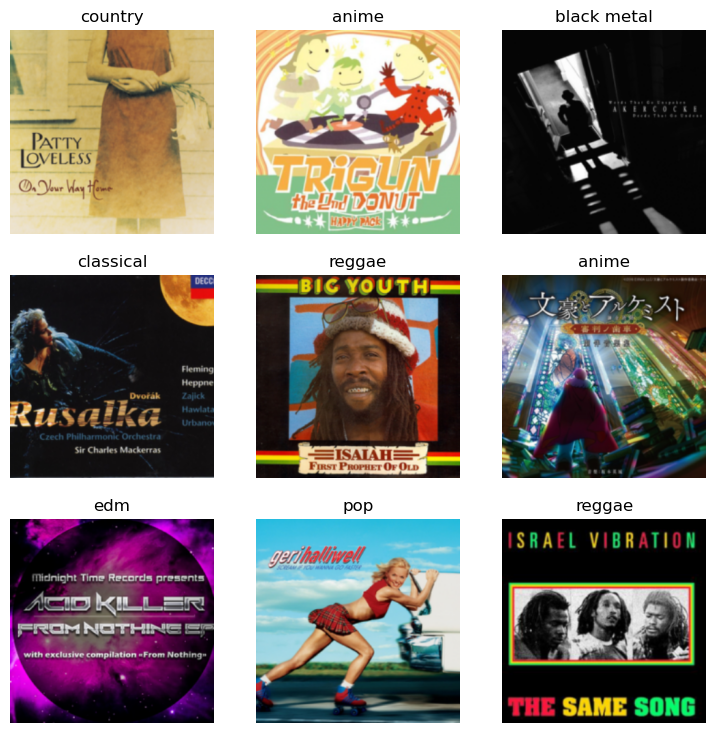

In [163]:
dls.valid.show_batch(max_n=9)

### fastai resnet18

Для начала дообучим только голову модели.

In [196]:
learn = vision_learner(dls, models.resnet18, metrics=accuracy, pretrained=True)

In [203]:
%%time
learn.fine_tune(3)

epoch,train_loss,valid_loss,accuracy,time
0,2.248584,1.450609,0.557990,10:15


epoch,train_loss,valid_loss,accuracy,time
0,1.513570,1.231407,0.616624,13:42
1,1.165148,1.103172,0.650773,13:34
2,0.844611,1.075532,0.661082,13:28


In [204]:
### Сохраним модель
learn.save('resnet18_fit_head')

Path('models/resnet18_fit_head.pth')

In [166]:
learn.load('resnet18_fit_head');

**Обучение всех слоёв модели**

Теперь можно перейти к обучению всей модели:
1. Разморозим все слои.
2. Найдём оптимальную скорость обучения learning rate.
3. Дообучим модель с найденным learning rate.

In [167]:
# Train all layers
learn.unfreeze()

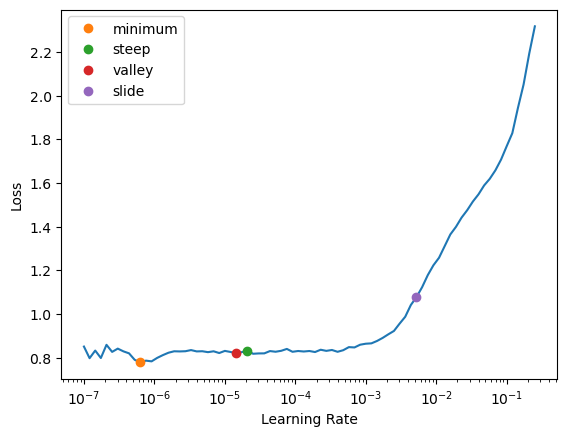

In [168]:
lrs = learn.lr_find(suggest_funcs=(minimum, steep, valley, slide))

In [170]:
%%time
learn.fit_one_cycle(10, lrs.valley, cbs=[SaveModelCallback(every_epoch=True), 
                                         EarlyStoppingCallback(monitor='accuracy', min_delta=0.01, patience=5)])

epoch,train_loss,valid_loss,accuracy,time
0,0.779817,1.108337,0.650773,13:05
1,0.785594,1.101075,0.659149,11:51
2,0.729070,1.088370,0.665593,11:36
3,0.718895,1.084230,0.659149,11:39
4,0.655829,1.070908,0.666237,11:41
5,0.624625,1.080342,0.663015,11:43
6,0.586655,1.073509,0.674613,11:43
7,0.573324,1.072186,0.677835,11:45
8,0.555879,1.079349,0.679124,11:46
9,0.560623,1.074861,0.674613,11:45


CPU times: total: 15h 31min 8s
Wall time: 1h 58min 40s


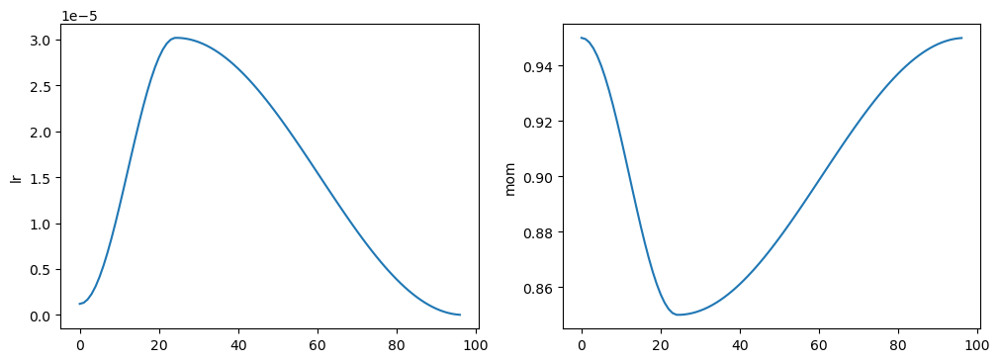

In [277]:
learn.recorder.plot_sched()

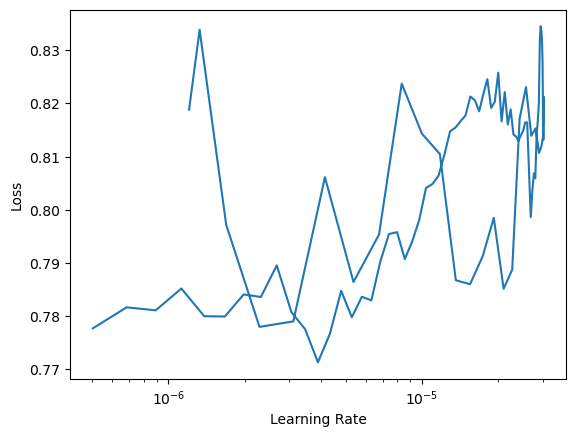

In [278]:
learn.recorder.plot_lr_find()

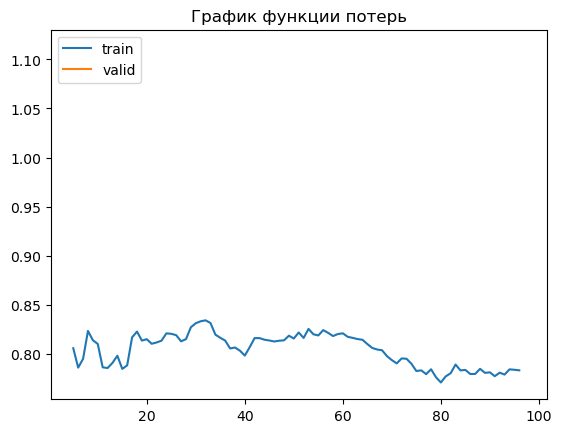

In [279]:
fig, ax = plt.subplots()
learn.recorder.plot_loss()
ax.set_title('График функции потерь');

In [332]:
interp = ClassificationInterpretation.from_learner(learn)

In [333]:
interp.most_confused()

[('jazz', 'country', 32),
 ('pop', 'country', 27),
 ('country', 'jazz', 23),
 ('edm', 'pop', 18),
 ('pop', 'anime', 18),
 ('country', 'pop', 16),
 ('disco', 'jazz', 15),
 ('classical', 'jazz', 14),
 ('country', 'reggae', 12),
 ('disco', 'pop', 12),
 ('reggae', 'jazz', 12),
 ('disco', 'country', 11),
 ('country', 'black metal', 10),
 ('disco', 'reggae', 10),
 ('jazz', 'classical', 10),
 ('pop', 'jazz', 10),
 ('rap', 'country', 10),
 ('reggae', 'country', 10),
 ('anime', 'pop', 8),
 ('jazz', 'edm', 8),
 ('jazz', 'pop', 8),
 ('pop', 'disco', 8),
 ('pop', 'edm', 8),
 ('classical', 'country', 7),
 ('country', 'disco', 7),
 ('country', 'rap', 7),
 ('edm', 'disco', 7),
 ('jazz', 'anime', 7),
 ('jazz', 'reggae', 7),
 ('anime', 'edm', 6),
 ('anime', 'jazz', 6),
 ('edm', 'anime', 6),
 ('edm', 'reggae', 6),
 ('reggae', 'classical', 6),
 ('country', 'anime', 5),
 ('country', 'classical', 5),
 ('disco', 'edm', 5),
 ('jazz', 'disco', 5),
 ('pop', 'rap', 5),
 ('rap', 'jazz', 5),
 ('reggae', 'edm', 5)

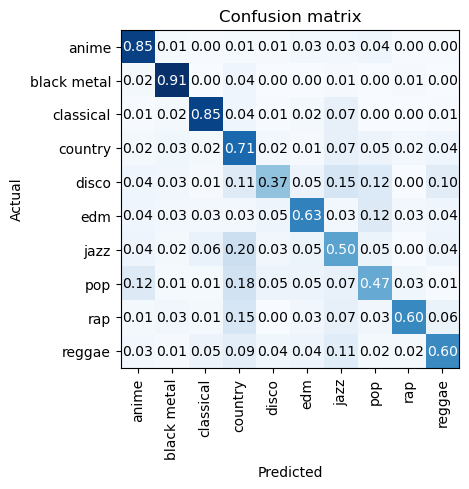

In [334]:
# interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)

In [209]:
learn.save('resnet18_fit_all')

Path('models/resnet18_fit_all.pth')

In [331]:
learn.load('resnet18_fit_all');

In [284]:
torch.save(learn.model, "model_resnet18.pt")

In [346]:
model = torch.load("model_resnet18.pt")
model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

**Вывод**

Мы загрузили предобученную модель resnet18. Дообучили сначала "голову" моедли, а потом и все слои на наших данных. Выбрали оптимальную скорость обучения learning_rate, и получили предсказания классов. Accuracy составило 0.672, что значительно выше показателей базовых моделей KNN и FAISS в 0.54.

### fastai resnet50

Попробуем решить задачу при помощи resnet50.

In [201]:
dls = ImageDataLoaders.from_df(data, path='.', 
                               valid_pct=0.2, 
                               seed=RANDOM_STATE,
                               bs=16,
                               shuffle=True,
                               item_tfms=Resize(224, method=ResizeMethod.Pad),
                               batch_tfms = list(aug_transforms(size = 299, max_warp = 0, min_scale=0.9)))

In [202]:
learn = vision_learner(dls, models.resnet50, metrics=accuracy, pretrained=True)

In [181]:
%%time
learn.fine_tune(freeze_epochs = 3, epochs = 10,
               cbs=[SaveModelCallback(every_epoch=True), 
                    EarlyStoppingCallback(monitor='accuracy', min_delta=0.01, patience=4)])

epoch,train_loss,valid_loss,accuracy,time
0,1.979925,1.383511,0.562500,26:15
1,1.570022,1.202932,0.605670,26:39
2,1.449742,1.167559,0.619201,25:53


epoch,train_loss,valid_loss,accuracy,time
0,1.065630,0.997856,0.665593,34:37
1,0.913464,0.958841,0.682990,34:28
2,0.889427,0.977772,0.672680,34:27
3,0.723493,1.020192,0.681057,34:26
4,0.581658,1.022349,0.688144,34:50
5,0.389532,1.068430,0.702964,37:27
6,0.289127,1.117815,0.704897,38:31
7,0.173989,1.130285,0.710696,34:44
8,0.180312,1.118091,0.704897,34:12
9,0.136887,1.144184,0.705541,34:11


No improvement since epoch 5: early stopping
CPU times: total: 2d 9h 21min 36s
Wall time: 7h 10min 47s


In [182]:
learn.save('resnet50_fit_fine_tune')

Path('models/resnet50_fit_fine_tune.pth')

In [ ]:
learn.load('resnet50_fit_fine_tune');

In [385]:
interp = ClassificationInterpretation.from_learner(learn)

In [386]:
interp.most_confused()

[('jazz', 'country', 24),
 ('pop', 'country', 24),
 ('edm', 'pop', 23),
 ('country', 'jazz', 22),
 ('country', 'pop', 16),
 ('classical', 'jazz', 15),
 ('disco', 'country', 14),
 ('anime', 'pop', 13),
 ('reggae', 'jazz', 13),
 ('disco', 'jazz', 12),
 ('jazz', 'classical', 11),
 ('edm', 'jazz', 10),
 ('pop', 'anime', 10),
 ('pop', 'jazz', 10),
 ('reggae', 'country', 9),
 ('anime', 'edm', 8),
 ('disco', 'edm', 8),
 ('disco', 'pop', 8),
 ('jazz', 'pop', 8),
 ('anime', 'jazz', 7),
 ('classical', 'country', 7),
 ('disco', 'reggae', 7),
 ('edm', 'country', 7),
 ('jazz', 'reggae', 7),
 ('pop', 'disco', 7),
 ('pop', 'edm', 7),
 ('rap', 'jazz', 7),
 ('country', 'disco', 6),
 ('edm', 'reggae', 6),
 ('rap', 'country', 6),
 ('rap', 'reggae', 6),
 ('anime', 'country', 5),
 ('country', 'anime', 5),
 ('edm', 'anime', 5),
 ('edm', 'classical', 5),
 ('jazz', 'disco', 5),
 ('jazz', 'edm', 5),
 ('pop', 'rap', 5),
 ('reggae', 'disco', 5),
 ('country', 'classical', 4),
 ('country', 'rap', 4),
 ('anime', 'r

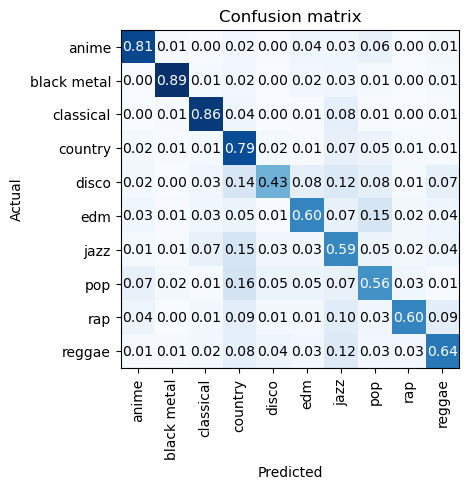

In [387]:
interp.plot_confusion_matrix(normalize=True)

In [337]:
torch.save(learn.model, "model.pt")
model = torch.load("model.pt")
model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 256

**Вывод**

Мы загрузили предобученную модель resnet50. Дообучили сначала "голову" модели, а потом и все слои на наших данных при помощи fine_tune. И получили предсказания классов. Accuracy составило 0.705, что значительно выше показателей базовых моделей KNN и FAISS в 0.672.

## Дополнительная задача: кластеризация

### Выбор количества кластеров с помощью силуэтного анализа при кластеризации KMeans

Силуэтный анализ можно использовать для изучения расстояния между полученными кластерами. График силуэта отображает меру того, насколько близка каждая точка в одном кластере к точкам в соседних кластерах, и, таким образом, дает возможность визуально оценить такие параметры, как количество кластеров. Эта мера имеет диапазон [-1, 1].

Коэффициенты силуэта (так называются эти значения) около +1 указывают на то, что образец находится далеко от соседних кластеров. Значение 0 указывает, что выборка находится на границе решения между двумя соседними кластерами или очень близко к ней, а отрицательные значения указывают на то, что эти выборки могли быть отнесены к неправильному кластеру.

For n_clusters = 2 The average silhouette_score is : 0.042762913
For n_clusters = 3 The average silhouette_score is : 0.035745647
For n_clusters = 4 The average silhouette_score is : 0.028956428
For n_clusters = 5 The average silhouette_score is : 0.014715082
For n_clusters = 6 The average silhouette_score is : 0.0177649
For n_clusters = 7 The average silhouette_score is : 0.02260302
For n_clusters = 8 The average silhouette_score is : 0.021421729
For n_clusters = 9 The average silhouette_score is : 0.020853406
For n_clusters = 10 The average silhouette_score is : 0.018774923


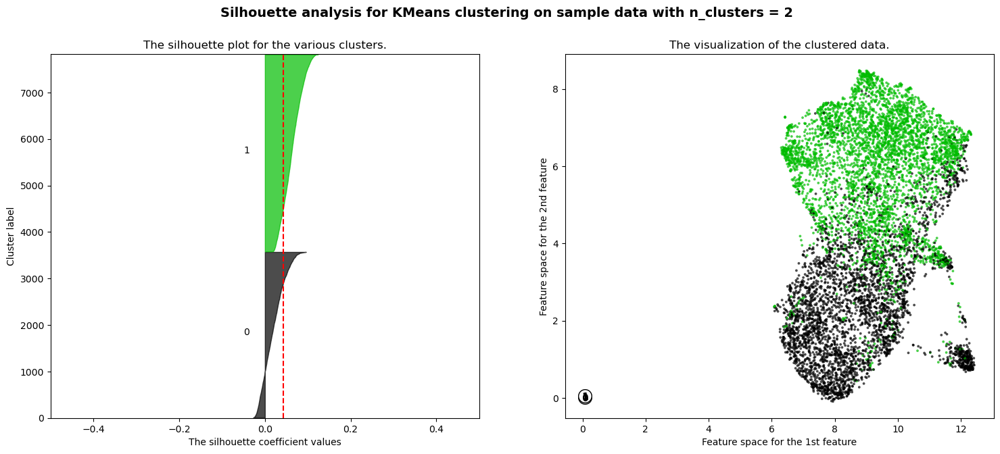

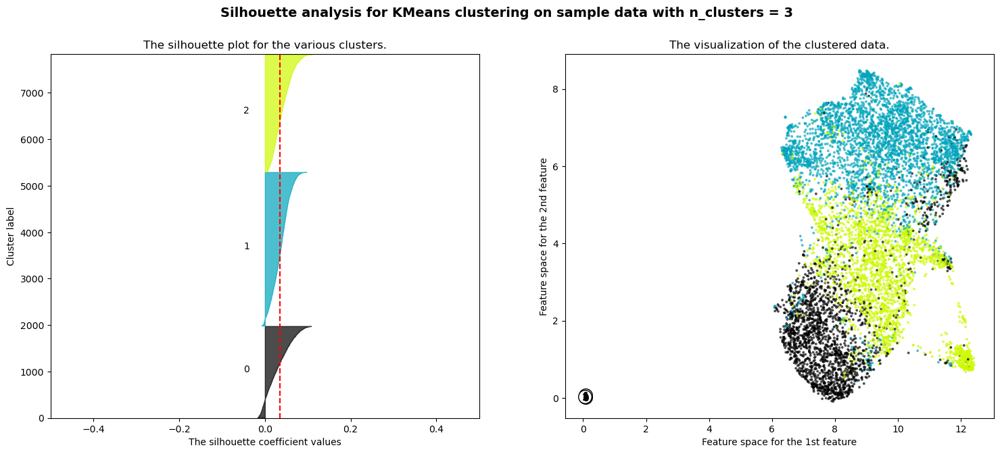

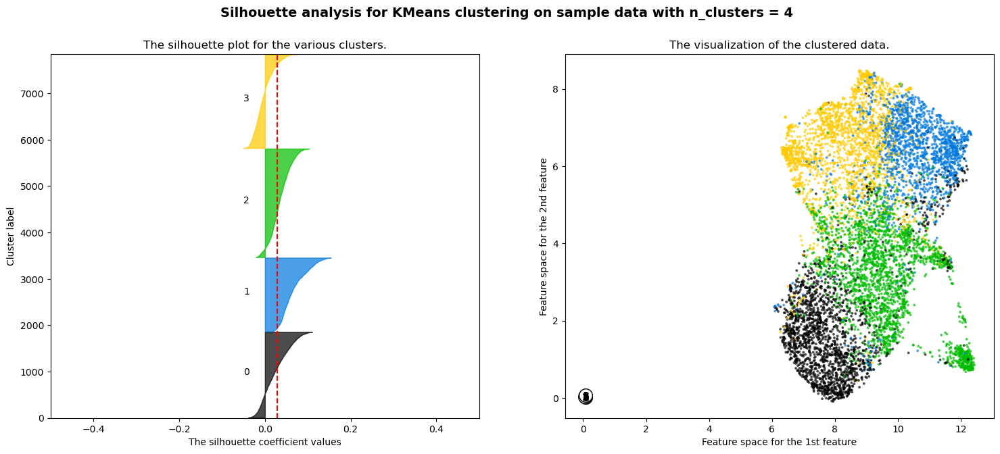

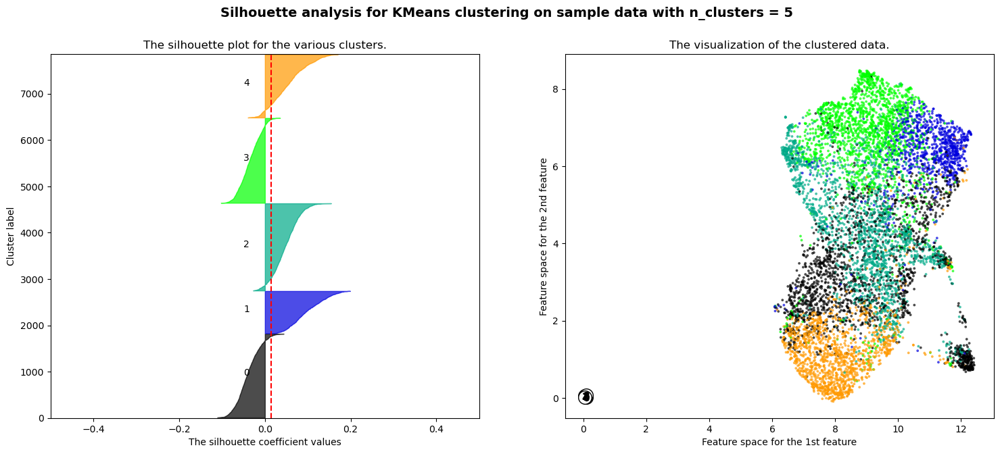

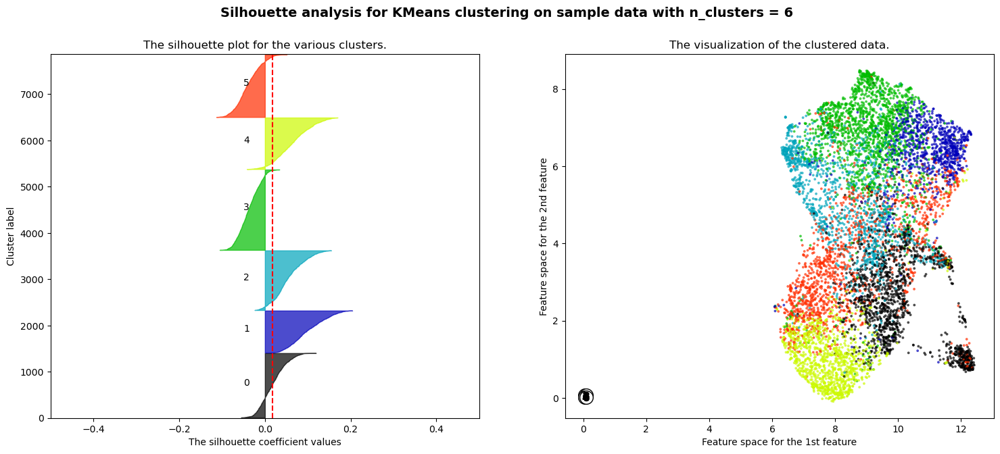

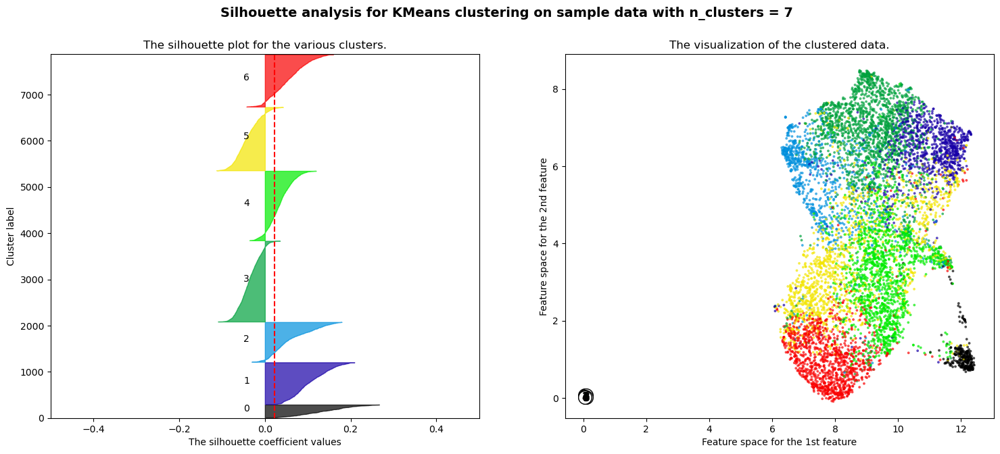

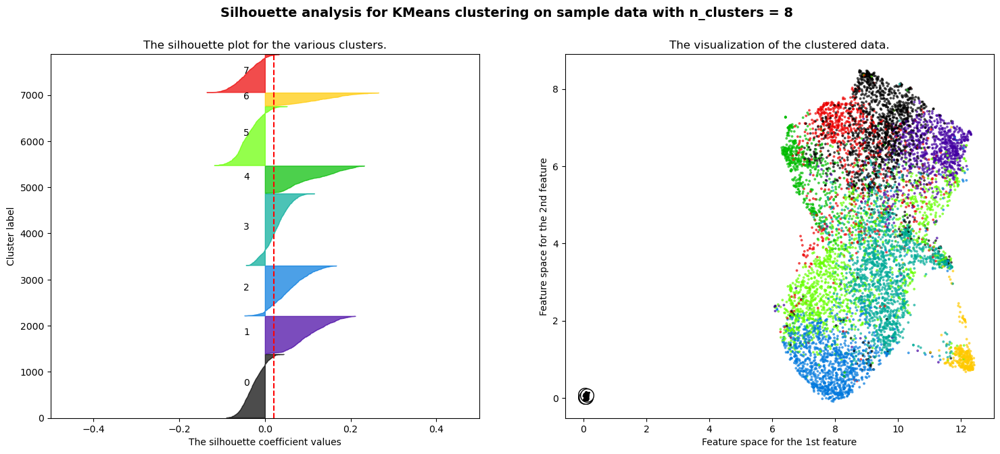

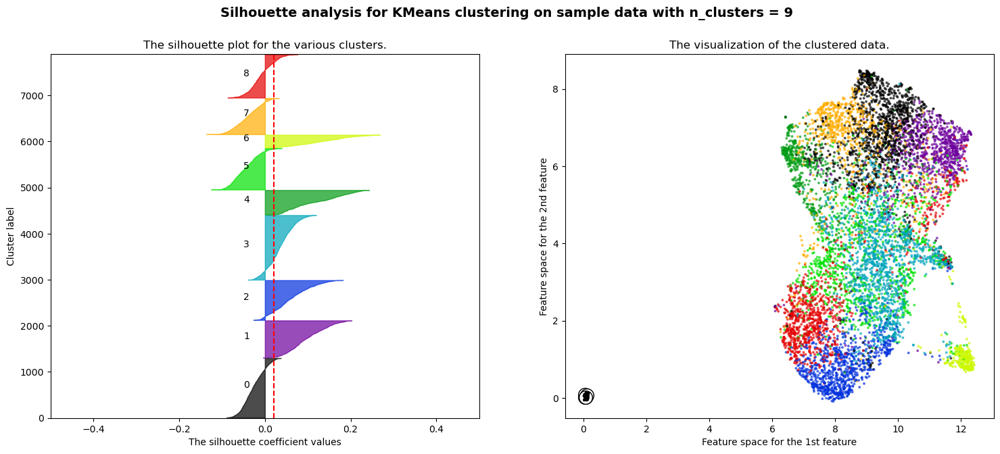

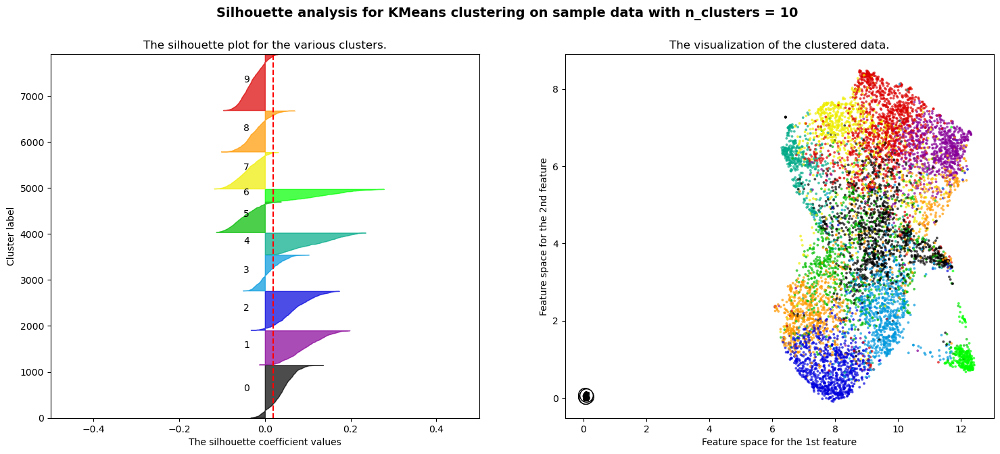

In [328]:
X = df_img.drop('target', axis=1).values
y = df_img['target'].values

umap_2d = UMAP(n_components=2, init='random', random_state=0)
X_reduced = umap_2d.fit_transform(X)

range_n_clusters = range(2, 11)


for n_clusters in range_n_clusters:
    # Создайте подзаголовок с 1 строкой и 2 столбцами
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # Первый подсюжет — это график силуэта
    # Коэффициент силуэта может варьироваться от -1 до 1, но в этом примере все
    # лежат в пределах [-0.1, 1]
    ax1.set_xlim([-0.5, 0.5])
    # (n_clusters+1)*10 предназначен для вставки пустого пространства между силуэтами
    # графики отдельных кластеров, чтобы четко их разграничить.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Инициализируем кластеризатор значением n_clusters и генератором случайных чисел
    # начальное число из 10 для воспроизводимости.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # Silhouette_score дает среднее значение для всех образцов.
    # Это дает представление о плотности и разделении образовавшихся
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Вычисляем оценки силуэта для каждого образца
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Объединить оценки силуэтов для образцов, принадлежащих
        # кластер i и отсортируйте их
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Пометьте графики силуэтов номерами их кластеров посередине.
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Вычисляем новый y_lower для следующего графика
        y_lower = y_upper + 10  # 10 для 0 образцов

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # Вертикальная линия для средней оценки силуэта всех значений.
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

#     ax1.set_yticks([])  # Очистите метки/галочки Yaxis
#     ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2-й график, показывающий фактически сформированные кластеры
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X_reduced[:, 0], X_reduced[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Маркировка кластеров
    centers = clusterer.cluster_centers_
    # Нарисуйте белые круги в центрах кластеров
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

**Вывод**

Согласно коэффициенту силуэта проще всего разделить данные на 2 кластера, однако это нам не подходит, хочеться выделять больше жанров. Наименьшее значение коэффициента силуэта выявлено для 5 и 6 кластеров. Лучше всего разделить данные на 7 кластеров. При делении на 8-10 кластеров silhouette_score продолжает снижаться.

Судя по графику силуэта при делении более чем на 3 кластера значение силуэта по некоторым кластерам ниже среднего значение. Также по толщине силуэтного графика можно визуализировать размер кластера. При делении на 2-3 клстера, один из них значительно больше остальных. При увеличении количества кластеров данные распределяются по разным кластером в более равных пропорциях.

## **Выводы**

**Описание проекта**

Pet-проект, чтобы потренировать навыки, приобрести новые и нескучно провести время.
Очевидно, что оформление музыкального альбома как-то связано с его содержанием. Но насколько связано? Как подтвердить это, опираясь на данные? И чем это может быть полезно?
Основная задача
Необходимо разработать модель, которая определит жанр музыкального альбома по изображению его обложки.

Изображения в формате PNG, упакованны в zip-архивы. Имя архива соответствует музыкальному жанру. Каждый zip-архив содержит папку с изображениями музыкальных обложек соответствующего жанра.

**Исследовательский анализ**

Данные содержат 7800 изображений - обложек альбомов в 10 разных жанрах. Размер изображений 300x300 dpi. Хорошо виден дисбаланс классов. Больше всего изображений в стиле "country", меньше всего в стиле "rap". Однако это пока не значит, что малочисленные жанры будут определяться хуже. Всё зависит от того насколько хорошо разграничены вектора изображений. Вернёмся к этому анализу после получения эмбедингов изображений.

**Векторизация изображений**

Используя предобученную модель resnet50 мы получили вектора для каждого изображения из обучающего датасета. Теперь стоит проверить есть ли дубликаты в данных.

**Построение baseline**

1. Мы подготовили базовую модель KNeighborsClassifier для классификации изображений. В среднем модель показала метрику accuracy=0.54. Лучше модель определяет наиболее многочисленные классы: anime, classical, country. Однако стоит заметить, что эти классы также достаточно хорошо выделяются на диаграмме рассеяния. Модель реже допускает ошибки также при выделения класса black metal, несмотря на то, что этот класс составляет всего лишь 0.057 от количеста всех данных, на диаграмме рассеяния видно, что он хорошо обособлен. Для всех остальных классов модель допускает много ошибок.

2. При помощи поиску по индексу FAISS мы решили задачу классификации обложек музыкальных альбомов. Мы сделали подбор параметров индекса. Лучшее значение метрики accuracy мы получили при параметрах: topn=20 (количество ближайших соседей), nprobe=40 (сколько соседних ячеек нужно искать), nlist=100 (количество кластеров индекса). Среди 20 ближайших соседей мы выбирали наиболее часто встречающийся музыкальных жанр (моду). Максимальное значение accuracy составило 0.537. Это практически не отличается от показателей модели KNeighborsClassifier.

**Классификация изображений при помощи resnet18 и FASTAI**

Мы загрузили предобученную модель resnet18. Дообучили сначала "голову" моедли, а потом и все слои на наших данных. Выбрали оптимальную скорость обучения learning_rate, и получили предсказания классов. Accuracy составило 0.672, что значительно выше показателей базовых моделей KNN и FAISS в 0.54.

**Классификация изображений при помощи resnet50 и FASTAI**

Мы загрузили предобученную модель resnet50. Дообучили сначала "голову" моедли, а потом и все слои на наших данных. Выбрали оптимальную скорость обучения learning_rate, и получили предсказания классов. Accuracy составило 0.705, что значительно выше показателей базовых моделей KNN и FAISS.

**Дополнительная задача: кластеризация**

Согласно коэффициенту силуэта проще всего разделить данные на 2 кластера, однако это нам не подходит, хочеться выделять больше жанров. Наименьшее значение коэффициента силуэта выявлено для 5 и 6 кластеров. Лучше всего разделить данные на 7 кластеров. При делении на 8-10 кластеров silhouette_score продолжает снижаться.

Судя по графику силуэта при делении более чем на 3 кластера значение силуэта по некоторым кластерам ниже среднего значение. Также по толщине силуэтного графика можно визуализировать размер кластера. При делении на 2-3 клстера, один из них значительно больше остальных. При увеличении количества кластеров данные распределяются по разным кластером в более равных пропорциях.

**Итог**
Лучше всего с задачей классификации обложек альбомов справилась дообученная модель resnet50. Accuracy составило 0.705, что значительно выше показателей базовых моделей KNN и FAISS.

## получение эмбедингов дообученной моделью

Посмотрим диаграмму рассеяния векторов полученных дообученной нами моеделью resnet50.

In [360]:
data = create_data_frame(genres)
data = data.query('image not in @dupl_list')
print(data.shape)
data.head()

(7760, 2)


,image,genre
0,./anime/anime/00095702-6b86-4bb1-880e-1e09e759a013.png,anime
1,./anime/anime/0091bee3-a67a-457e-8c5f-b4a1055b1211.png,anime
2,./anime/anime/00a9d688-337f-4807-83cd-596540f1683b.png,anime
3,./anime/anime/00ddb3de-75db-4e27-ad3d-441a5dc95636.png,anime
4,./anime/anime/00ec64ef-c6ab-4a63-91df-59ce8db4ea25.png,anime


In [362]:
resnet = model

for param in resnet.parameters():
    ### замораживаем веса
    param.requires_grad_(False)
    
### берём все слои кроме последнего
modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules)
resnet.eval();

### переводим изображение в нужный формат: меняем размер картинки и нормализуем
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                            std=[0.229, 0.224, 0.225]
                            )
preprocess = transforms.Compose([transforms.Resize(224),
                                 transforms.ToTensor(),
                                 norm])

Жанр: classical
(300, 300)


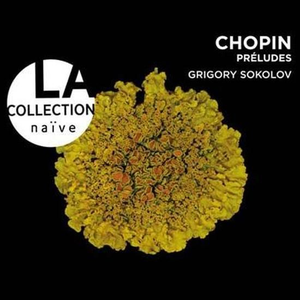

torch.Size([25088])

In [363]:
# Для проверки работы применим векторизацию к одному изображению
row = data.sample(1)

row = data.sample(1)
image_name = row.iloc[0]['image']
img_genre = row.iloc[0]['genre']
# img = Image.open(path + img_genre + '/' + img_genre + '/' + image_name).convert('RGB')
img = Image.open(image_name).convert('RGB')

print(f'Жанр: {img_genre}')
print(img.size)
display(img)

image_tensor = preprocess(img)
output_tensor = resnet(image_tensor.unsqueeze(0)).flatten()
output_tensor.size()

In [365]:
%%time
df_img = vectorize_img(data, path)

7760it [03:19, 38.98it/s]


Размер вектора изображений: (7760, 25088)
CPU times: total: 27min 2s
Wall time: 3min 49s


In [366]:
### Выделим целевой признак
df_img['target'] = data['genre']

In [367]:
###  выберем названия изображений в качестве индекса
df_img.set_index('image', inplace=True)

In [372]:
df_img.shape

(7800, 25089)

In [369]:
df_img.head()

,0,1,2,3,4,5,6,7,8,9,...,25079,25080,25081,25082,25083,25084,25085,25086,25087,target
image,,,,,,,,,,,,,,,,,,,,,
./anime/anime/00095702-6b86-4bb1-880e-1e09e759a013.png,3.220271,3.995403,3.074186,2.767266,2.914555,3.365066,3.419039,5.360624,5.744991,3.639588,...,1.699235,0.944317,1.475484,1.883144,1.216543,0.616288,0.773565,1.667696,0.980517,anime
./anime/anime/0091bee3-a67a-457e-8c5f-b4a1055b1211.png,0.679273,0.282618,0.052429,0.120588,0.454398,0.000000,0.000000,0.823090,0.198568,1.289109,...,4.299418,3.017967,1.353760,1.681140,0.397705,0.962553,1.752084,2.256175,1.608650,anime
./anime/anime/00a9d688-337f-4807-83cd-596540f1683b.png,0.181101,1.779702,3.202281,3.279035,1.443601,0.000000,0.000000,0.599432,3.359617,4.856340,...,2.540039,0.205549,0.619431,1.558427,2.350869,2.737690,3.226297,1.433579,0.674590,anime
./anime/anime/00ddb3de-75db-4e27-ad3d-441a5dc95636.png,0.000000,0.771174,0.334580,1.540230,2.935713,4.463791,3.244552,1.355044,3.532984,3.178113,...,1.104214,0.000000,0.000000,0.371995,1.391174,2.058480,1.402869,0.867182,0.232341,anime
./anime/anime/00ec64ef-c6ab-4a63-91df-59ce8db4ea25.png,2.882421,3.943369,3.769167,3.488515,2.037068,0.070702,0.000000,4.825772,6.328937,6.174473,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,anime


In [374]:
df_img.dropna(inplace=True)

In [375]:
df_img.shape

(7720, 25089)

In [376]:
X = df_img[df_img.columns.drop('target')].values

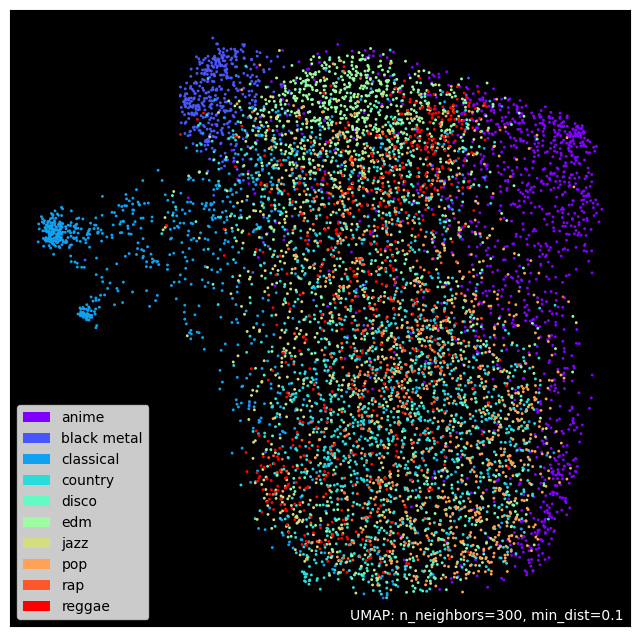

In [377]:
manifold = umap.UMAP(n_components=2, n_neighbors=300, min_dist = 0.1).fit(X)
umap.plot.points(manifold, labels=df_img['target'].to_numpy(), theme="fire");

**Вывод**

Можно заметить, что классы уже лучше разграничены.